## 📜 Welcome Back, Visioneer
Having successfully passed through **Gate 1: The Chamber of Singular Truths**, you have proven your mastery of decomposition and reconstruction. The Grand Archivist nods approvingly:

"Well done, apprentice. You have learned to see the essential from the chaotic. Now you face Gate 2, where you must combine purification, detection, and recognition to unlock ancient secrets."

But the Archivist's warning echoes still:
"Beware. Those who attempt to pass with borrowed visions or false answers are cursed. Only true effort and understanding unlock the path forward."

## 🌀 Gate 2: Mosaic of Whispers
Theme: Image Denoising, Harris Corner Detection, Feature Matching

In the Gallery of Fragmented Memories, you find a beautiful Byzantine mosaic showing portraits of an ancient philosopher. As you admire it, Professor Dhoom Ketu steps out from the shadows, his wild hair floating and eyes full of mischief.

“Ah! The Mosaic of the Hidden Philosopher!” he says with a grin, handing you the preserved portrait. “This is your reference key.”

Suddenly, the Curse of Temporal Decay strikes—the rest of the mosaic is corrupted with noise and distortions. Professor Ketu sighs, “The curse again! Luckily, I saved the original before it was damaged. Now you can use this for your assignment.”

Run the following code to set things up:



# Assignment setup

In [ ]:
## Importing recipes
%matplotlib inline

import imageio
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from google.colab import drive
from skimage.color import rgb2gray
from tqdm import tqdm

# Mounting google drive
drive.mount('/content/drive')


import matplotlib.pyplot as plt

def display_images_in_row(images, labels=None, cmap=None):
    """
    Display multiple images in a single row with labels below them.

    Args:
        images (list): List of images (numpy arrays or tensors convertible to numpy).
        labels (list, optional): List of labels corresponding to each image.
        cmap (str, optional): Colormap for displaying grayscale images.
    """
    num_images = len(images)
    print(f"Displaying {num_images} image{'s' if num_images > 1 else ''}")

    fig, axs = plt.subplots(1, num_images, figsize=(4 * num_images, 4))

    # Ensure axs is iterable
    if num_images == 1:
        axs = [axs]

    for i, (ax, img) in enumerate(zip(axs, images)):
        # Choose colormap
        if cmap is None:
            if img.ndim == 2 or (img.ndim == 3 and img.shape[2] == 1):
                ax.imshow(img.squeeze(), cmap="gray")
            else:
                ax.imshow(img)
        else:
            ax.imshow(img, cmap=cmap)

        ax.axis("off")

        # Add label below image if available
        if labels is not None and i < len(labels):
            ax.set_title(labels[i], fontsize=12, fontweight="bold", pad=10)

    plt.tight_layout()
    plt.show()


# Resize the original image to a smaller size
def resize_image(img, max_size=200):
    """Resize image while maintaining aspect ratio"""
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
        return resized
    return img


## Making recipes
base_path = "./ES666/Assignment2/"
mosaic_path = os.path.join(base_path, "mosaic.jpg")
key_path = os.path.join(base_path, "key.jpg")

# Load images
mosaic = cv2.imread(mosaic_path)        # BGR format
key = cv2.imread(key_path)

# Convert to RGB for matplotlib display
mosaic_rgb = cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB)
key_rgb = cv2.cvtColor(key, cv2.COLOR_BGR2RGB)

# Also convert to grayscale (float [0,1]) if needed for processing
mosaic_gray = rgb2gray(mosaic_rgb)
key_gray = rgb2gray(key_rgb)
mosaic_rgb_rs = resize_image(mosaic_rgb, max_size=500)
mosaic_rgb_rs = mosaic_rgb_rs.astype(np.float32) / 255.0

# Mosaic and Key

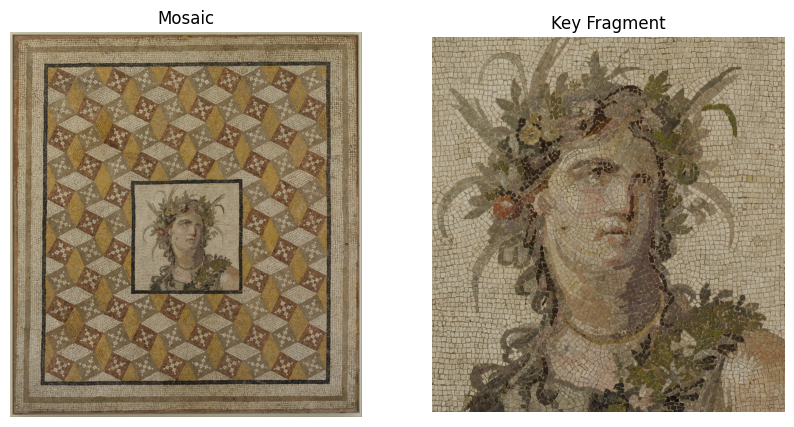

In [2]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(mosaic_rgb)
axs[0].set_title("Mosaic")
axs[0].axis("off")
axs[1].imshow(key_rgb)
axs[1].set_title("Key Fragment")
axs[1].axis("off")
plt.show()

### Task 1: Master the Arts of Purification (4 Marks)
Professor Ketu: "First, we must counteract the curse using the four sacred filtering techniques."

Implement the four denoising methods (mean, median, bilateral and gaussian) and compare their effectiveness:

In [3]:
# run this cell as it is

def add_gaussian_noise(img, mean=0, var=0.01):
    if img.dtype != np.float32:
        img = img.astype(np.float32) / 255.0

    sigma = var**0.5
    noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)
    noisy_img = np.clip(img + noise, 0.0, 1.0)

    return noisy_img


def add_salt_pepper_noise(img, amount=0.05):

    noisy_img = img.copy()
    H, W, _ = noisy_img.shape

    num_noisy_pixels = int(amount * H * W)

    row_coords = np.random.randint(0, H, num_noisy_pixels)
    col_coords = np.random.randint(0, W, num_noisy_pixels)

    num_salt = num_noisy_pixels // 2

    noisy_img[row_coords[:num_salt], col_coords[:num_salt], :] = 1.0

    noisy_img[row_coords[num_salt:], col_coords[num_salt:], :] = 0.0

    return noisy_img

def generate_noisy_versions_rgb(img, gaussian_vars, sp_amounts):

    noisy_versions = {
        "gaussian": np.array([add_gaussian_noise(img, var=v) for v in gaussian_vars]),
        "salt_pepper": np.array([add_salt_pepper_noise(img, amount=a) for a in sp_amounts])
    }
    return noisy_versions

gaussian_vars = [0.001, 0.01, 0.05]       # variance levels
sp_amounts = [0.01, 0.05, 0.1]           # salt & pepper intensity

noisy_mosaic = generate_noisy_versions_rgb(mosaic_rgb_rs, gaussian_vars, sp_amounts)



Gaussian Noise with different variance
Displaying 3 images


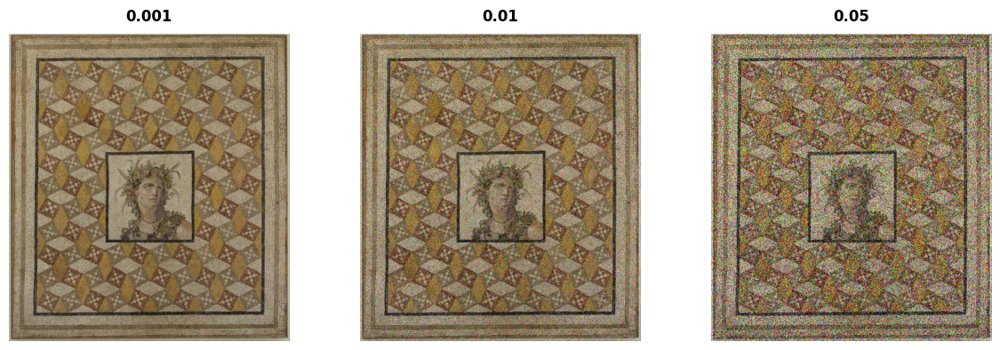

Salt and pepper Noise with different intensities
Displaying 3 images


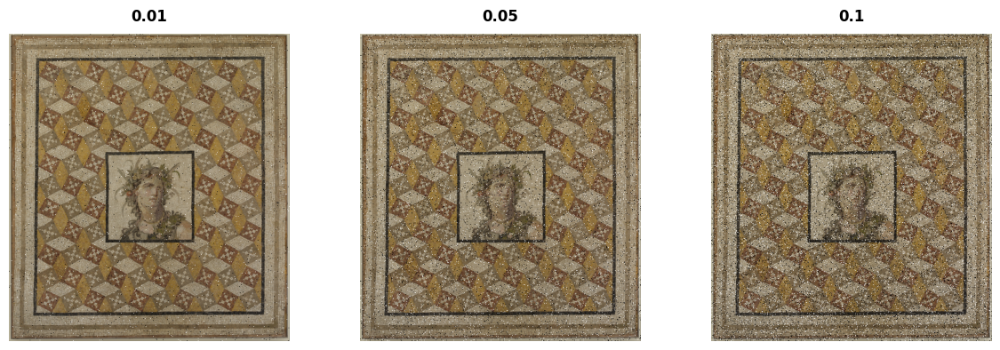

In [4]:
print("Gaussian Noise with different variance")
display_images_in_row(noisy_mosaic["gaussian"],labels=["0.001","0.01","0.05"])
print("Salt and pepper Noise with different intensities")
display_images_in_row(noisy_mosaic["salt_pepper"], labels=["0.01","0.05","0.1"])



### Implement filters here for all the noise levels

In [5]:
def conv2d(a, f):
    s = f.shape + tuple(np.subtract(a.shape, f.shape) + 1)
    print("s",s)
    strd = np.lib.stride_tricks.as_strided
    print("strd",strd)
    subM = strd(a, shape = s, strides = a.strides * 2)
    print("subM",subM,subM.shape)
    print("f",f)
    return np.einsum('ij,ijkl->kl', f, subM)

In [6]:
def conv(img,kernel):
    """
    this will convolve a kernel matrix over img with stride 1 and appropriate padding
    so that size remains same.
    applications is to apply filter over an image.

    input
        img : np.array
        kernel : np.array
    output
        result : np.array
    """
    # Handle 2D images by adding channel dimension
    original_2d = img.ndim == 2
    if original_2d:
        img = img[..., np.newaxis]

    h, w, c = img.shape
    k = kernel.shape[0]
    padding = k // 2

    # Pad the image once
    p_img = np.pad(img, ((padding, padding), (padding, padding), (0, 0)), mode='constant')

    # Pre-allocate result
    result = np.zeros_like(img)

    # Vectorized convolution using sliding windows
    for ch in range(c):
        for ki in range(k):
            for kj in range(k):
                # Extract the shifted image region
                shifted = p_img[ki:ki+h, kj:kj+w, ch]
                # Multiply by kernel weight and accumulate
                if kernel.ndim == 3:
                    result[:, :, ch] += shifted * kernel[ki, kj, ch]
                else:
                    result[:, :, ch] += shifted * kernel[ki, kj]

    # Return original shape if input was 2D
    return result.squeeze() if original_2d else result


In [7]:
from logging import raiseExceptions
import numpy as np

def mean_filter(img, kernel_size=3):
    # Write your code
    if img.ndim == 2:
        img = img[..., np.newaxis]
    filtered= conv(img, np.ones((kernel_size, kernel_size, img.shape[2]))/(kernel_size*kernel_size))
    return filtered

def median_filter(img, kernel_size=3):
    # Write your code here
    if img.ndim == 2:
        img = img[..., np.newaxis]

    filtered = np.zeros_like(img)
    offset = kernel_size//2
    m,n= img.shape[0],img.shape[1]
    for i in range(m):
      for j in range(n):
        x_low= max(0,i-offset)
        y_low = max(0,j-offset)
        x_high = min(m-1, x_low + kernel_size)
        y_high = min(n-1, y_low + kernel_size)
        filtered[i,j] = np.median(img[x_low:x_high,y_low:y_high],axis=(0,1))
    return filtered

def gaussian_filter(img, kernel_size=5, sigma=1.0):
    # Write your code here
    if img.ndim == 2:
        img = img[..., np.newaxis]
    kernel= np.zeros((kernel_size,kernel_size,img.shape[2]))
    k=kernel_size//2
    kernel_x = [np.exp(-((i-k)**2)/2*sigma**2) for i in range(kernel_size)]
    kernel_y = kernel_x
    kernel = np.outer(kernel_x,kernel_y)
    kernel = kernel/np.sum(kernel)
    kernel = np.repeat(kernel[:,:,np.newaxis],3,axis = 2)
    filtered = conv(img,kernel)
    return filtered

def bilateral_filter(img, diameter=5, sigma_color=0.2, sigma_space=1.0):
    # Write your code here
    # its a combination of gaussian and intensity difference
    if img.ndim == 2:
        img = img[..., np.newaxis]

    k=diameter//2
    img_padded = np.pad(img, ((k, k), (k, k), (0, 0)), mode='reflect')
    gaussian_k = np.outer(np.exp(-np.arange(-k, k+1)**2/(2*sigma_space**2)), np.exp(-np.arange(-k, k+1)**2/(2*sigma_space**2)))
    gaussian_k = np.repeat(gaussian_k[:,:,np.newaxis],3,axis = 2)
    filtered = np.zeros_like(img)
    for i in range(img.shape[0]):
      for j in range(img.shape[1]):
        x_high = i+diameter
        y_high = j+diameter
        patch = img_padded[i:x_high,j:y_high]
        diff = (patch - img[i,j])**2
        idiff = np.exp(-diff/(2*sigma_color**2))
        w =np.sum(idiff*gaussian_k,axis=(0,1))
        filtered[i,j] = np.sum(idiff*gaussian_k*patch,axis = (0,1)) / w
    return np.clip(filtered, 0, 1)



In [8]:
img2 = bilateral_filter(mosaic_rgb_rs)

(500, 456, 3) (500, 456, 3)


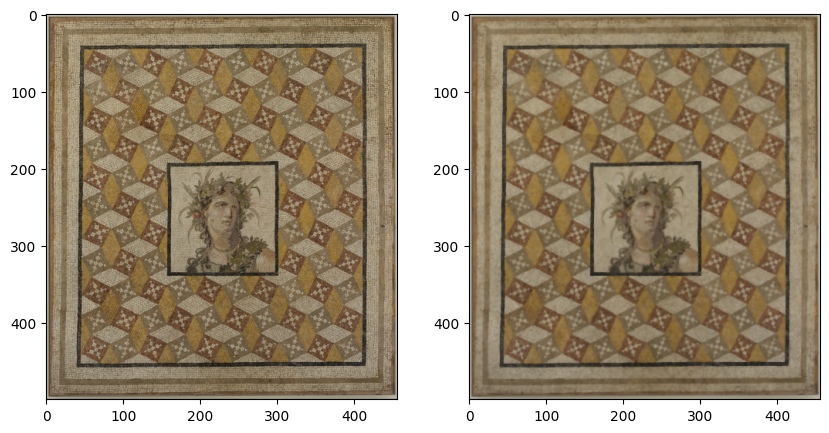

In [9]:
print(mosaic_rgb_rs.shape,img2.shape)
fig, ax =plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(mosaic_rgb_rs)
ax[1].imshow(img2)


Row 1: gaussian noise (level=0.001)
Displaying 5 images


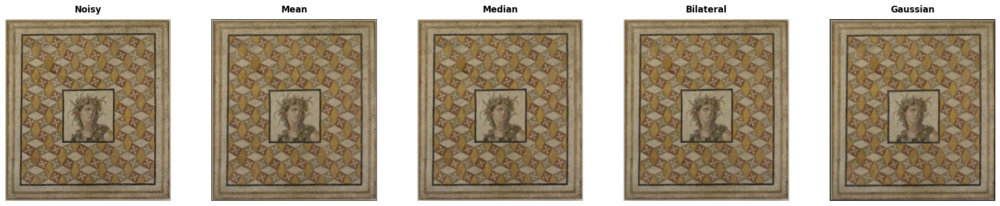

Row 2: gaussian noise (level=0.01)
Displaying 5 images


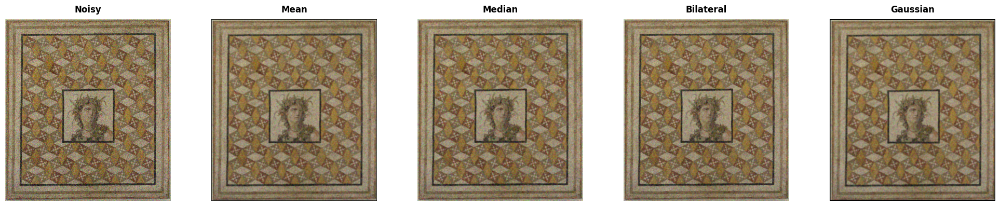

Row 3: gaussian noise (level=0.05)
Displaying 5 images


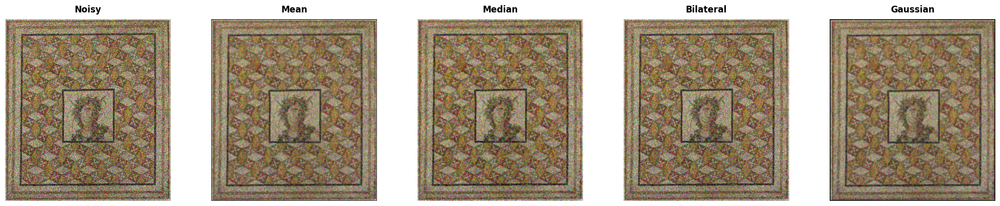

Row 4: salt_pepper noise (level=0.01)
Displaying 5 images


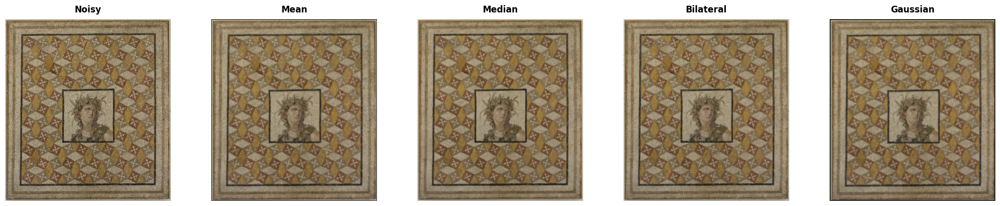

Row 5: salt_pepper noise (level=0.05)
Displaying 5 images


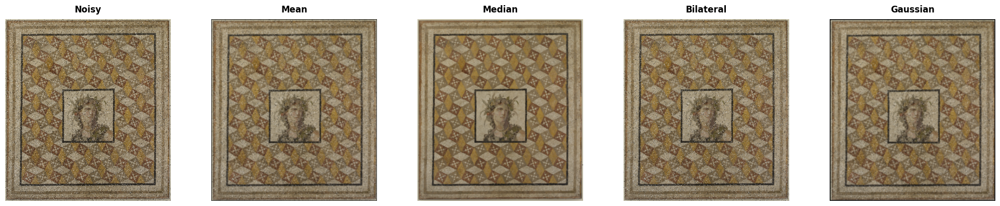

Row 6: salt_pepper noise (level=0.1)
Displaying 5 images


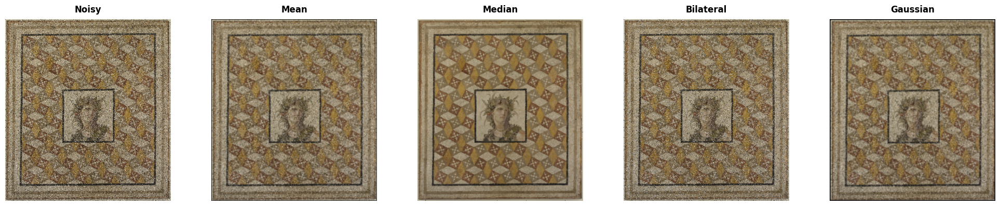

In [503]:
def test_filters_minimal( noisy_versions, filter_functions, filter_names):
    rows = []
    row_info = []  # keep track of (noise_type, param)

    noise_params = [
        ('gaussian', [0.001, 0.01, 0.05]),
        ('salt_pepper', [0.01, 0.05, 0.1])
    ]

    for noise_type, params in noise_params:
        for i, param in enumerate(params):
            noisy = noisy_versions[noise_type][i]
            denoised_imgs = [f(noisy) for f in filter_functions]
            row_imgs = [noisy] + denoised_imgs

            rows.append(row_imgs)
            row_info.append((noise_type, param))

    # Display all rows
    for i, (row_imgs, (noise_type, param)) in enumerate(zip(rows, row_info)):
        print(f"Row {i+1}: {noise_type} noise (level={param})")
        display_images_in_row(row_imgs, ["Noisy"] + filter_names)

    return rows, row_info

filter_functions = [mean_filter, median_filter, bilateral_filter, gaussian_filter]
filter_names = ['Mean', 'Median', 'Bilateral', 'Gaussian']


images, image_info =test_filters_minimal(noisy_mosaic, filter_functions, filter_names)

# you should find psnr or ssim as well to get a better understanding

In [501]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import pandas as pd

# psnr for each image and noise type
original_image = mosaic_rgb_rs.copy()
results = []
for i, (row_imgs, (noise_type, param)) in enumerate(zip(images, image_info)):
    # Calculate PSNR and SSIM for the noisy image
    noisy_img = row_imgs[0]
    psnr_noisy = peak_signal_noise_ratio(original_image, noisy_img)
    ssim_noisy = structural_similarity(original_image, noisy_img, channel_axis=-1, data_range=noisy_img.max() - noisy_img.min())
    results.append({
        'Noise Type': noise_type,
        'Noise Level': param,
        'Filter': 'Noisy',
        'PSNR': psnr_noisy,
        'SSIM': ssim_noisy
    })

    # Calculate PSNR and SSIM for each denoised image
    for j, denoised_img in enumerate(row_imgs[1:]):
        filter_name = filter_names[j]
        psnr_denoised = peak_signal_noise_ratio(original_image, denoised_img)
        ssim_denoised = structural_similarity(original_image, denoised_img, channel_axis=-1, data_range=denoised_img.max() - denoised_img.min())
        results.append({
            'Noise Type': noise_type,
            'Noise Level': param,
            'Filter': filter_name,
            'PSNR': psnr_denoised,
            'SSIM': ssim_denoised
        })

results_df = pd.DataFrame(results)
display(results_df)
# get the best filter for each noise type and noise level combination
best_filters = results_df.loc[results_df[results_df["Filter"]!="Noisy"]\
                              .groupby(['Noise Type', 'Noise Level'])['PSNR'].idxmax()]
# best_filters = best_filters[best_filters['Filter'] != 'Noisy']

print("Best filter for each noise type and level based on PSNR:")
display(best_filters[['Noise Type', 'Noise Level', 'Filter', 'PSNR']])

best_filters_ssim = results_df.loc[results_df[results_df["Filter"]!="Noisy"]\
                                   .groupby(['Noise Type', 'Noise Level'])['SSIM'].idxmax()]
# best_filters_ssim = best_filters_ssim[best_filters_ssim['Filter'] != 'Noisy']

print("\nBest filter for each noise type and level based on SSIM:")
display(best_filters_ssim[['Noise Type', 'Noise Level', 'Filter', 'SSIM']])

,Noise Type,Noise Level,Filter,PSNR,SSIM
0,gaussian,0.001,Noisy,30.002512,0.891833
1,gaussian,0.001,Mean,20.844966,0.551793
2,gaussian,0.001,Median,26.506284,0.685488
3,gaussian,0.001,Bilateral,27.135002,0.703207
4,gaussian,0.001,Gaussian,17.799310,0.256176
5,gaussian,0.010,Noisy,20.021710,0.521716
6,gaussian,0.010,Mean,20.357746,0.493831
7,gaussian,0.010,Median,23.982811,0.583839
8,gaussian,0.010,Bilateral,25.573093,0.685063
9,gaussian,0.010,Gaussian,17.616697,0.233992


Best filter for each noise type and level based on PSNR:


,Noise Type,Noise Level,Filter,PSNR
3,gaussian,0.001,Bilateral,27.135002
8,gaussian,0.010,Bilateral,25.573093
12,gaussian,0.050,Median,19.660648
17,salt_pepper,0.010,Median,26.953899
22,salt_pepper,0.050,Median,26.711927
27,salt_pepper,0.100,Median,26.369698



Best filter for each noise type and level based on SSIM:


,Noise Type,Noise Level,Filter,SSIM
3,gaussian,0.001,Bilateral,0.703207
8,gaussian,0.010,Bilateral,0.685063
12,gaussian,0.050,Median,0.383970
17,salt_pepper,0.010,Median,0.705295
22,salt_pepper,0.050,Median,0.706618
27,salt_pepper,0.100,Median,0.716911


📖 Theory Q: Question: Which filtering method works best for gaussian noise and which works for salt and pepper noise? Why?  

Ans: For gaussian noise, we observe Bilateral filter works best because of its ability to retain edges while smoothing the gaussian noise in the image.

For the salt and peper noise, Median filter performs best because it removes each pixed with median value of its neighbouring pixels. This removes noise spikes created by salt-peper noise effectively.

### Task 2: Detect the Points of Truth (3 Marks)
Professor Ketu: "Seek geometric truth in the original, not the corrupted version! The curse creates false corners."

Implement Harris Corner Detection on the pristine original image:

Displaying 2 images


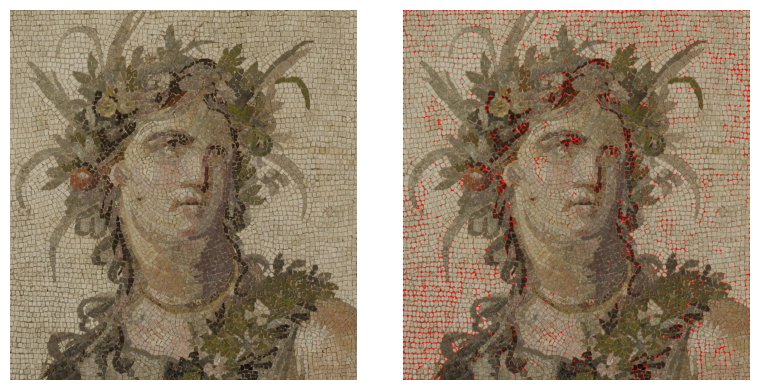

Displaying 2 images


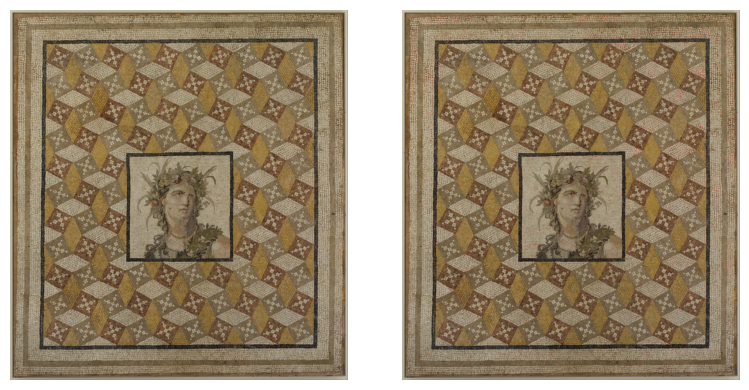

In [41]:
def detect_harris_corner(image):

    corner_image = None
    # Write your code here
    if image.ndim > 2:
        gray_img = rgb2gray(image)
    corner_image = image.copy()

    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_x = sobel_x[:,:,np.newaxis]
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    sobel_y = sobel_y[:,:,np.newaxis]
    Ix = conv(gray_img, sobel_x)
    Iy = conv(gray_img, sobel_y)

    # box filter
    Ixx = conv(Ix**2, np.ones((3, 3,1))/9).squeeze()
    Iyy = conv(Iy**2, np.ones((3, 3, 1))/9).squeeze()
    Ixy = conv(Ix*Iy, np.ones((3, 3, 1))/9).squeeze()

    # k value for corner vs edge
    k = 0.04
    threshold = 0.02
    R = Ixx*Iyy - Ixy**2 - k*(Ixx + Iyy)**2
    # thresholding
    corners = np.argwhere(R > threshold * R.max())
    # non maximal suppression
    corners_final = []
    for i,j in corners:
        if all(R[i,j] >= R[max(i-1,0):i+2, max(j-1,0):j+2].flatten()):
            corners_final.append((i,j))
    # Mark corners in red for all corners just for visualization
    for i,j in corners:
        corner_image[i, j] = [255, 0, 0] 
    return corner_image ,np.array(corners_final)
key_harris , key_corners = detect_harris_corner(key_rgb)
mosaic_harris , mosaic_corners = detect_harris_corner(mosaic_rgb)
display_images_in_row([key_rgb,key_harris])
display_images_in_row([mosaic_rgb,mosaic_harris])

In [42]:
key_harris.shape,key_corners.shape,mosaic_harris.shape,mosaic_corners.shape

((1017, 953, 3), (7495, 2), (3803, 3469, 3), (22849, 2))

📖 Theory Q: What mathematical property of the Harris matrix allows it to distinguish between edges and corners?  

Ans. Edges have one large eigen value for the covariance matrix as most of information is present in one direction, where as corners contain information in both direction of 2D plane so both eigen values are large. 

The metric `R= det(M) - k * trace (M)` is negative if one eigen value is large than the other which will represent edges. For flat regions R is close to 0, and for corners R is a big positive number.

### Task 3: Find the Hidden Philosopher (3 Marks)
Professor Ketu: "Combine my teachings! Let the original guide your search, let clarity reveal the details."

Implement feature matching to find the philoshopher in the mosaic, you can use SSD (Sum of squared differences):

Hint:How can you describe small patches around keypoints in both images?  
 How do you measure similarity between descriptors?

In [43]:
def extract_descriptors(img, corners, patch_size=15):
    img = rgb2gray(img)
    descriptors, valid_points = [], []
    # Write your code here
    offset = patch_size // 2
    rows, cols = img.shape[:2]
    for (i, j) in tqdm(corners):
        if i - offset >= 0 and i + offset < rows and j - offset >= 0 and j + offset < cols:
            patch = img[i - offset:i + offset + 1, j - offset:j + offset + 1]
            descriptors.append(patch.flatten())
            valid_points.append((i, j))
                    
    return np.array(valid_points), np.array(descriptors)

def match_features(desc1, desc2, pts1, pts2, ratio=0.7):
    matches = []
    # Write your code here
    for i, d1 in tqdm(enumerate(desc1)):
        distances = np.sum((desc2 - d1)**2, axis=1)
        if len(distances) < 2:
            continue
        nearest_idx = np.argmin(distances)
        nearest_dist = distances[nearest_idx]
        distances[nearest_idx] = 1e10
        second_nearest_dist = np.min(distances)

        if nearest_dist < ratio * second_nearest_dist:
            matches.append((pts1[i], pts2[nearest_idx]))
    return matches

pts_mosaic, desc_mosaic = extract_descriptors(mosaic_rgb, mosaic_corners)
pts_key, desc_key = extract_descriptors(key_rgb, key_corners)

100%|██████████| 7495/7495 [00:00<00:00, 219622.38it/s]


In [44]:
desc_key.shape, pts_key.shape, desc_mosaic.shape, pts_mosaic.shape

((6870, 225), (6870, 2), (22845, 225), (22845, 2))

6870it [03:02, 37.60it/s]


[(array([  7, 490]), array([1528, 1778])), (array([  7, 549]), array([1918, 2067])), (array([  8, 184]), array([1529, 1472])), (array([  8, 209]), array([1529, 1497])), (array([  8, 588]), array([1529, 1876])), (array([  8, 708]), array([1529, 1996])), (array([  9, 599]), array([1530, 1887])), (array([  9, 603]), array([1530, 1891])), (array([10,  9]), array([1531, 1297])), (array([ 10, 162]), array([2217, 1271])), (array([ 10, 186]), array([1531, 1474])), (array([ 11, 123]), array([1532, 1411])), (array([ 11, 754]), array([1532, 2042])), (array([ 13, 115]), array([1534, 1403])), (array([ 13, 675]), array([1534, 1963])), (array([ 13, 723]), array([1534, 2011])), (array([ 13, 737]), array([1534, 2025])), (array([ 13, 771]), array([1534, 2059])), (array([ 13, 876]), array([1534, 2164])), (array([14, 39]), array([1535, 1327])), (array([ 14, 368]), array([1535, 1656])), (array([ 14, 671]), array([1535, 1959])), (array([ 14, 685]), array([1535, 1973])), (array([ 14, 765]), array([1535, 2053

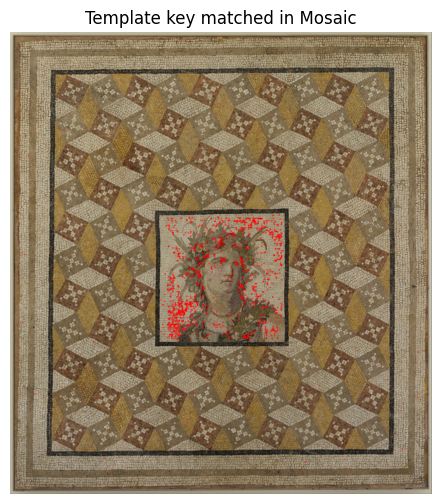

In [45]:
matches = match_features(desc_key, desc_mosaic, pts_key, pts_mosaic)

print(matches)
mosaic_vis = mosaic_rgb.copy()
for (y1, x1), (y2, x2) in matches:
    cv2.circle(mosaic_vis, (x2, y2), 5, (255, 0, 0), 2)

plt.figure(figsize=(10, 6))
plt.imshow(mosaic_vis)
plt.title("Template key matched in Mosaic")
plt.axis("off")
plt.show()

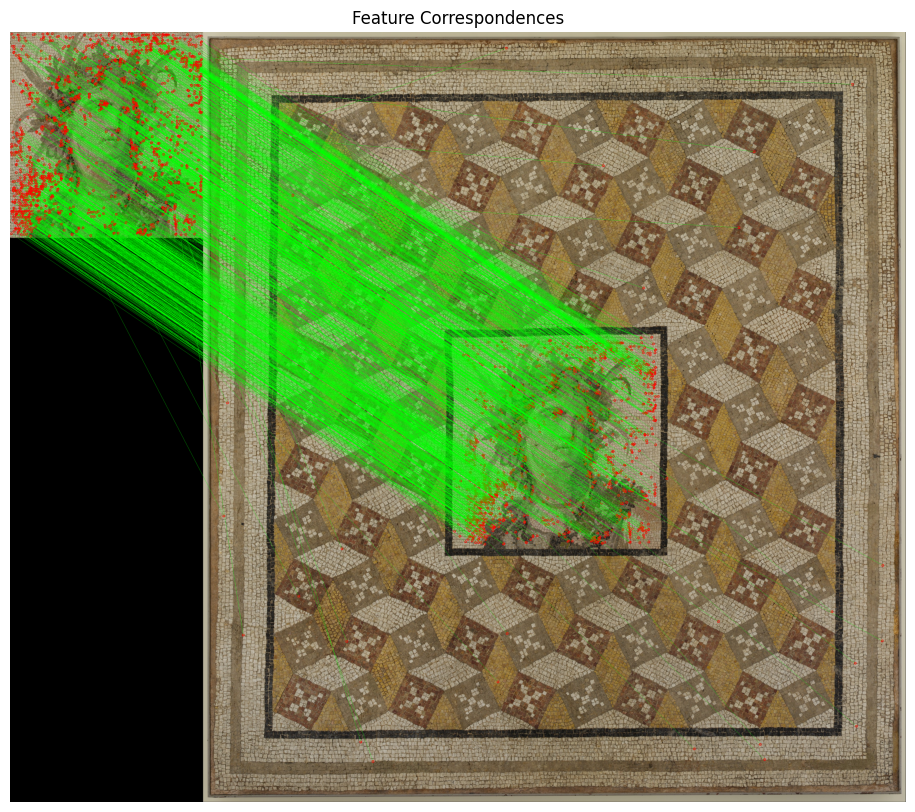

In [46]:
# plot correspondences
def plot_correspondences(img1, img2, matches):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    out_img = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
    out_img[:h1, :w1] = img1
    out_img[:h2, w1:w1 + w2] = img2

    for (y1, x1), (y2, x2) in matches:
        cv2.circle(out_img, (x1, y1), 5, (255, 0, 0), 2)
        cv2.circle(out_img, (x2 + w1, y2), 5, (255, 0, 0), 2)
        cv2.line(out_img, (x1, y1), (x2 + w1, y2), (0, 255, 0), 1)

    plt.figure(figsize=(15, 10))
    plt.imshow(out_img)
    plt.title("Feature Correspondences")
    plt.axis("off")
    plt.show()
    return out_img
correspondence_img = plot_correspondences(key_rgb, mosaic_rgb, matches)

📖 Theory Q: What are potential weaknesses of SSD-based matching compared to modern descriptors like SIFT/ORB?  
Ans. The SSD based feature descriptor matching lacks orientation information and is not optimal for matching features in transformed images. SIFT/ORB descriptors are scale and rotation invariant which means those features can be matched between any sets of images that differ by scale, translation and rotation.